In [1]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import keras 
from tqdm import tqdm
from keras.callbacks import EarlyStopping,ModelCheckpoint
from sklearn.metrics import confusion_matrix , accuracy_score
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import glob 
import pandas as pan
import matplotlib.pyplot as plotter
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Create Files_Name
image_data='brain_mri_scan_images'
pd.DataFrame(os.listdir(image_data),columns=['Files_Name'])

,Files_Name
0,.ipynb_checkpoints
1,negative
2,positive
3,Untitled.ipynb


In [3]:
files = [i for i in glob.glob(image_data + "//*//*")]
np.random.shuffle(files)
labels = [os.path.dirname(i).split("/")[-1] for i in files]
data = zip(files, labels)
dataframe = pan.DataFrame(data, columns = ["Image", "Label"])
dataframe

,Image,Label
0,brain_mri_scan_images\negative\78.jpg,brain_mri_scan_images\negative
1,brain_mri_scan_images\negative\70.jpg,brain_mri_scan_images\negative
2,brain_mri_scan_images\positive\53.jpg,brain_mri_scan_images\positive
3,brain_mri_scan_images\positive\42.jpg,brain_mri_scan_images\positive
4,brain_mri_scan_images\negative\80.jpg,brain_mri_scan_images\negative
...,...,...
222,brain_mri_scan_images\positive\36.jpg,brain_mri_scan_images\positive
223,brain_mri_scan_images\negative\76.jpg,brain_mri_scan_images\negative
224,brain_mri_scan_images\negative\71.jpg,brain_mri_scan_images\negative
225,brain_mri_scan_images\negative\22.jpg,brain_mri_scan_images\negative


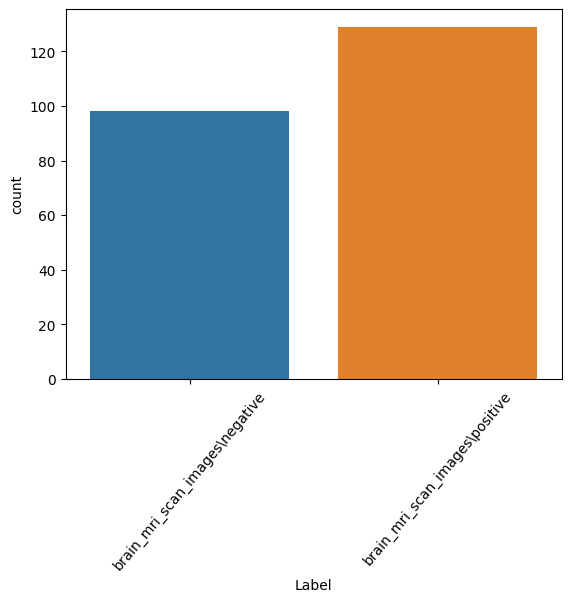

In [4]:
sns.countplot(x = dataframe["Label"])
plotter.xticks(rotation = 50);

In [5]:
train_data_dir =image_data
batch_size = 32
target_size = (224,224)
validation_split = 0.2
train= tf.keras.preprocessing.image_dataset_from_directory(
    train_data_dir,
    validation_split=validation_split,
    subset="training",
    seed=100,
    image_size=target_size,
    batch_size=batch_size,
)
validation= tf.keras.preprocessing.image_dataset_from_directory(
    train_data_dir,
    validation_split=validation_split,
    subset="validation",
    seed=200,
    image_size=target_size,
    batch_size=batch_size,
)

Found 227 files belonging to 3 classes.
Using 182 files for training.
Found 227 files belonging to 3 classes.
Using 45 files for validation.


In [6]:
class_names = train.class_names
class_names

['.ipynb_checkpoints', 'negative', 'positive']

In [7]:
from keras import backend as K
def f1_score(y_true, y_pred): #taken from old keras source code
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [8]:
METRICS = [
      tf.keras.metrics.BinaryAccuracy(name='accuracy'),
      tf.keras.metrics.Precision(name='precision'),
      tf.keras.metrics.Recall(name='recall'),  
      tf.keras.metrics.AUC(name='auc'),
        f1_score,
]

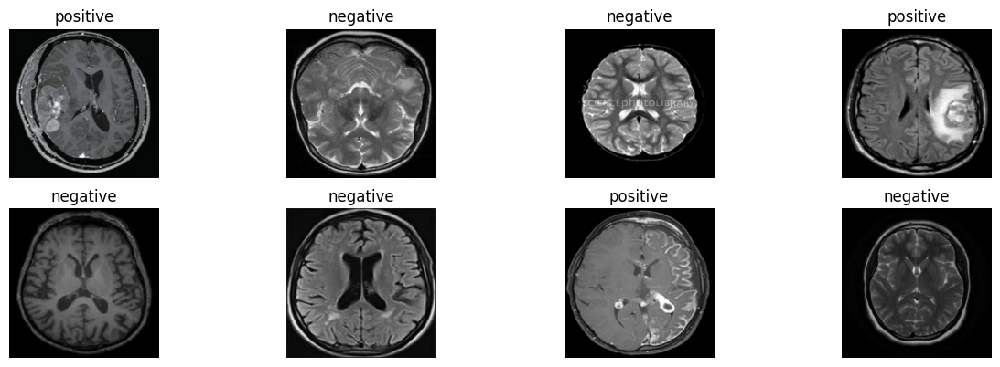

In [9]:
plt.figure(figsize=(15, 20))
for images, labels in train.take(1):
    for i in range(8):
        ax = plt.subplot(8, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

## EfficientNetV2B0

In [10]:
base_model = tf.keras.applications.EfficientNetV2B0(input_shape=(224,224,3),include_top=False,weights='imagenet')
base_model.trainable = False
keras_model=keras.models.Sequential()
keras_model.add(base_model)
keras_model.add(keras.layers.Flatten()) 
keras_model.add(keras.layers.Dropout(0.5))
keras_model.add(keras.layers.Dense(10,activation=tf.nn.softmax))
keras_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetv2-b0 (Functio  (None, 7, 7, 1280)        5919312   
 nal)                                                            
                                                                 
 flatten (Flatten)           (None, 62720)             0         
                                                                 
 dropout (Dropout)           (None, 62720)             0         
                                                                 
 dense (Dense)               (None, 10)                627210    
                                                                 
Total params: 6546522 (24.97 MB)
Trainable params: 627210 (2.39 MB)
Non-trainable params: 5919312 (22.58 MB)
_________________________________________________________________


In [11]:
tf.keras.utils.plot_model(keras_model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=80)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [12]:
checkpoint =ModelCheckpoint("my_keras_model.h5", save_best_only=True)

In [13]:
early_stopping =EarlyStopping(patience=5, restore_best_weights=True)

In [14]:
keras_model.compile(optimizer ='Adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])
hist=keras_model.fit_generator(train,epochs=20,validation_data=validation,callbacks=[checkpoint,early_stopping])

Epoch 1/20
6/6 [==============================] - 32s 3s/step - loss: 1.1988 - accuracy: 0.6429 - val_loss: 0.5590 - val_accuracy: 0.8000
Epoch 2/20
6/6 [==============================] - 8s 1s/step - loss: 0.3815 - accuracy: 0.9011 - val_loss: 0.1170 - val_accuracy: 0.9333
Epoch 3/20
6/6 [==============================] - 8s 1s/step - loss: 0.1903 - accuracy: 0.9670 - val_loss: 0.0238 - val_accuracy: 1.0000
Epoch 4/20
6/6 [==============================] - 7s 1s/step - loss: 0.1544 - accuracy: 0.9615 - val_loss: 0.0451 - val_accuracy: 0.9778
Epoch 5/20
6/6 [==============================] - 8s 1s/step - loss: 0.0453 - accuracy: 0.9835 - val_loss: 0.0168 - val_accuracy: 0.9778
Epoch 6/20
6/6 [==============================] - 7s 1s/step - loss: 0.0492 - accuracy: 0.9780 - val_loss: 0.0281 - val_accuracy: 0.9778
Epoch 7/20
6/6 [==============================] - 7s 1s/step - loss: 0.0051 - accuracy: 1.0000 - val_loss: 0.0342 - val_accuracy: 0.9778
Epoch 8/20
6/6 [========================

In [15]:
score, acc = keras_model.evaluate(validation)
print('Test Loss =', score)
print('Test Accuracy =', acc)

2/2 [==============================] - 2s 408ms/step - loss: 0.0168 - accuracy: 0.9778
Test Loss = 0.016757862642407417
Test Accuracy = 0.9777777791023254


In [16]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy,val_loss,val_accuracy
0,1.198844,0.642857,0.558980,0.800000
1,0.381493,0.901099,0.116965,0.933333
2,0.190282,0.967033,0.023765,1.000000
3,0.154424,0.961538,0.045100,0.977778
4,0.045309,0.983516,0.016758,0.977778
5,0.049244,0.978022,0.028148,0.977778
6,0.005078,1.000000,0.034249,0.977778
7,0.010043,0.994505,0.033212,0.977778
8,0.009376,0.994505,0.055145,0.977778
9,0.003271,1.000000,0.033700,0.977778


In [17]:
X_val,y_val,y_pred=[],[],[]
for images, labels in validation:
    y_val.extend(labels.numpy())
    X_val.extend(images.numpy())
predictions=keras_model.predict(np.array(X_val))
for i in predictions:
    y_pred.append(np.argmax(i))
df=pd.DataFrame()
df['Actual'],df['Prediction']=y_val,y_pred

2/2 [==============================] - 3s 424ms/step


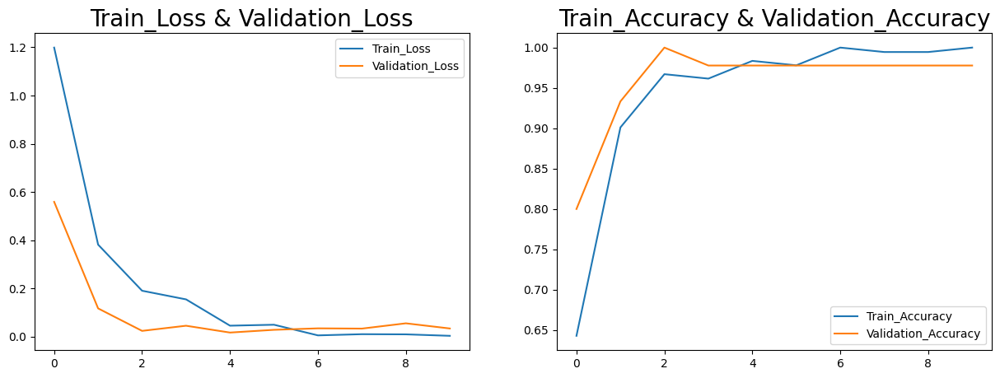

In [18]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()

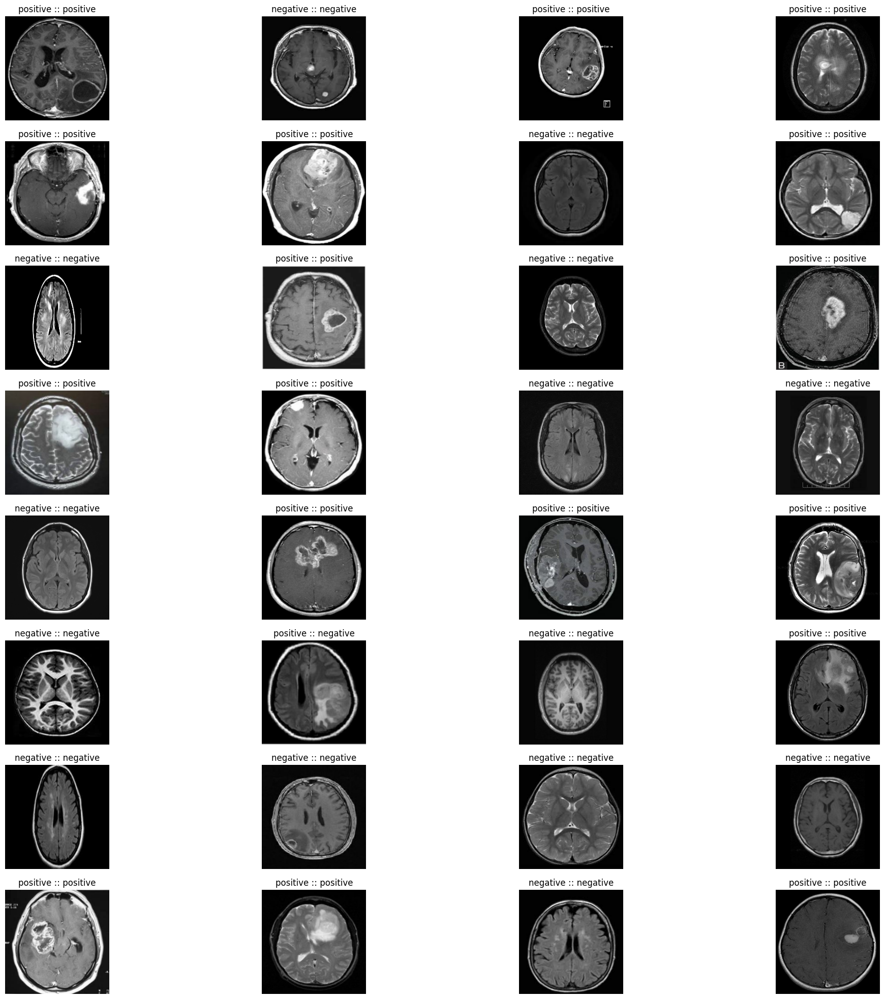

In [19]:
plt.figure(figsize=(25,25))
for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(X_val[i].astype("uint8"))
    plt.title(f'{class_names[y_val[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")

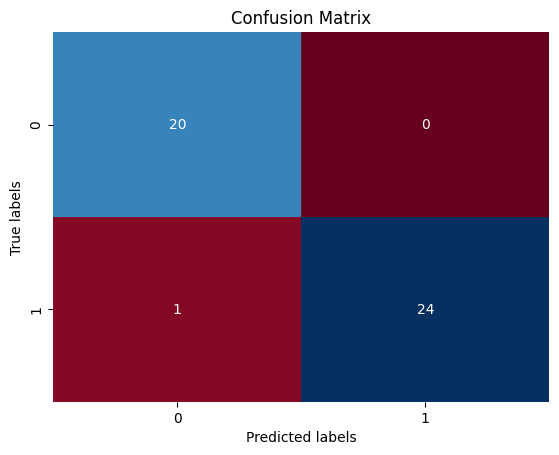

array([[20,  0],
       [ 1, 24]], dtype=int64)

In [20]:
ax= plt.subplot()
CM = confusion_matrix(y_val,y_pred)
sns.heatmap(CM, annot=True, fmt='g', ax=ax,cbar=False,cmap='RdBu')
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels') 
ax.set_title('Confusion Matrix')
plt.show()
CM

In [21]:
Acc = accuracy_score(y_val,y_pred)
print("accuracy is: {0:.3f}%".format(Acc * 100))

accuracy is: 97.778%


## VGG19 

In [22]:
base_model = tf.keras.applications.VGG19(input_shape=(224,224,3),include_top=False,weights='imagenet')
base_model.trainable = False
keras_model=keras.models.Sequential()
keras_model.add(base_model)
keras_model.add(keras.layers.Flatten()) 
keras_model.add(keras.layers.Dropout(0.5))
keras_model.add(keras.layers.Dense(10,activation=tf.nn.softmax))
keras_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dropout_1 (Dropout)         (None, 25088)             0         
                                                                 
 dense_1 (Dense)             (None, 10)                250890    
                                                                 
Total params: 20275274 (77.34 MB)
Trainable params: 250890 (980.04 KB)
Non-trainable params: 20024384 (76.39 MB)
_________________________________________________________________


In [23]:
tf.keras.utils.plot_model(keras_model, to_file='model19.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=80)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [24]:
checkpoint =ModelCheckpoint("my_keras_model_VGG19.h5", save_best_only=True)

In [25]:
early_stopping =EarlyStopping(patience=5, restore_best_weights=True)

In [26]:
keras_model.compile(optimizer ='Adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])
hist=keras_model.fit_generator(train,epochs=20,validation_data=validation,callbacks=[checkpoint,early_stopping])

Epoch 1/20
6/6 [==============================] - 61s 10s/step - loss: 7.2885 - accuracy: 0.6374 - val_loss: 2.7948 - val_accuracy: 0.8222
Epoch 2/20
6/6 [==============================] - 59s 10s/step - loss: 2.5762 - accuracy: 0.8352 - val_loss: 0.8486 - val_accuracy: 0.8889
Epoch 3/20
6/6 [==============================] - 60s 10s/step - loss: 1.4621 - accuracy: 0.9121 - val_loss: 0.4357 - val_accuracy: 0.9778
Epoch 4/20
6/6 [==============================] - 60s 10s/step - loss: 0.3638 - accuracy: 0.9451 - val_loss: 0.0526 - val_accuracy: 0.9778
Epoch 5/20
6/6 [==============================] - 61s 10s/step - loss: 0.6369 - accuracy: 0.9286 - val_loss: 0.2645 - val_accuracy: 0.9778
Epoch 6/20
6/6 [==============================] - 62s 11s/step - loss: 0.2281 - accuracy: 0.9725 - val_loss: 0.2353 - val_accuracy: 0.9778
Epoch 7/20
6/6 [==============================] - 62s 11s/step - loss: 0.3237 - accuracy: 0.9780 - val_loss: 0.3283 - val_accuracy: 0.9778
Epoch 8/20
6/6 [===========

In [27]:
score, acc = keras_model.evaluate(validation)
print('Test Loss =', score)
print('Test Accuracy =', acc)

2/2 [==============================] - 13s 4s/step - loss: 7.4271e-06 - accuracy: 1.0000
Test Loss = 7.427062882925384e-06
Test Accuracy = 1.0


In [28]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy,val_loss,val_accuracy
0,7.288471,0.637363,2.794776,0.822222
1,2.576202,0.835165,0.848648,0.888889
2,1.462069,0.912088,0.435705,0.977778
3,0.363785,0.945055,0.052558,0.977778
4,0.636870,0.928571,0.264492,0.977778
5,0.228098,0.972527,0.235281,0.977778
6,0.323721,0.978022,0.328294,0.977778
7,0.132298,0.978022,0.091009,0.977778
8,0.118682,0.989011,0.033379,0.977778
9,0.083858,0.978022,0.000466,1.000000


In [29]:
X_val,y_val,y_pred=[],[],[]
for images, labels in validation:
    y_val.extend(labels.numpy())
    X_val.extend(images.numpy())
predictions=keras_model.predict(np.array(X_val))
for i in predictions:
    y_pred.append(np.argmax(i))
df=pd.DataFrame()
df['Actual'],df['Prediction']=y_val,y_pred

2/2 [==============================] - 12s 4s/step


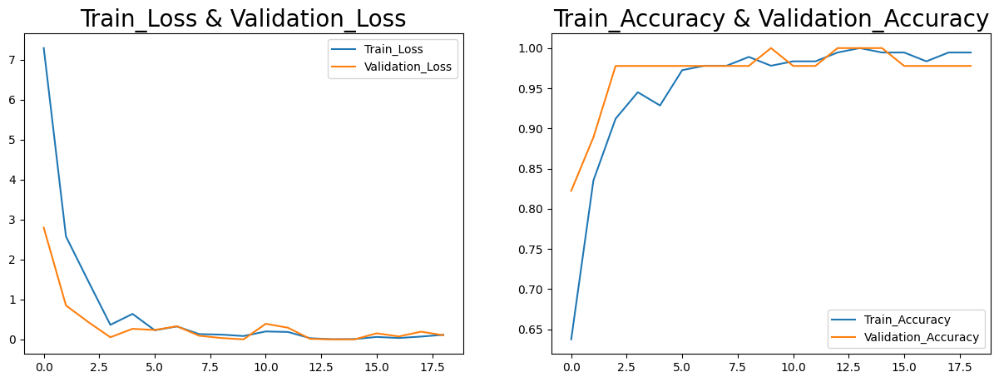

In [30]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()

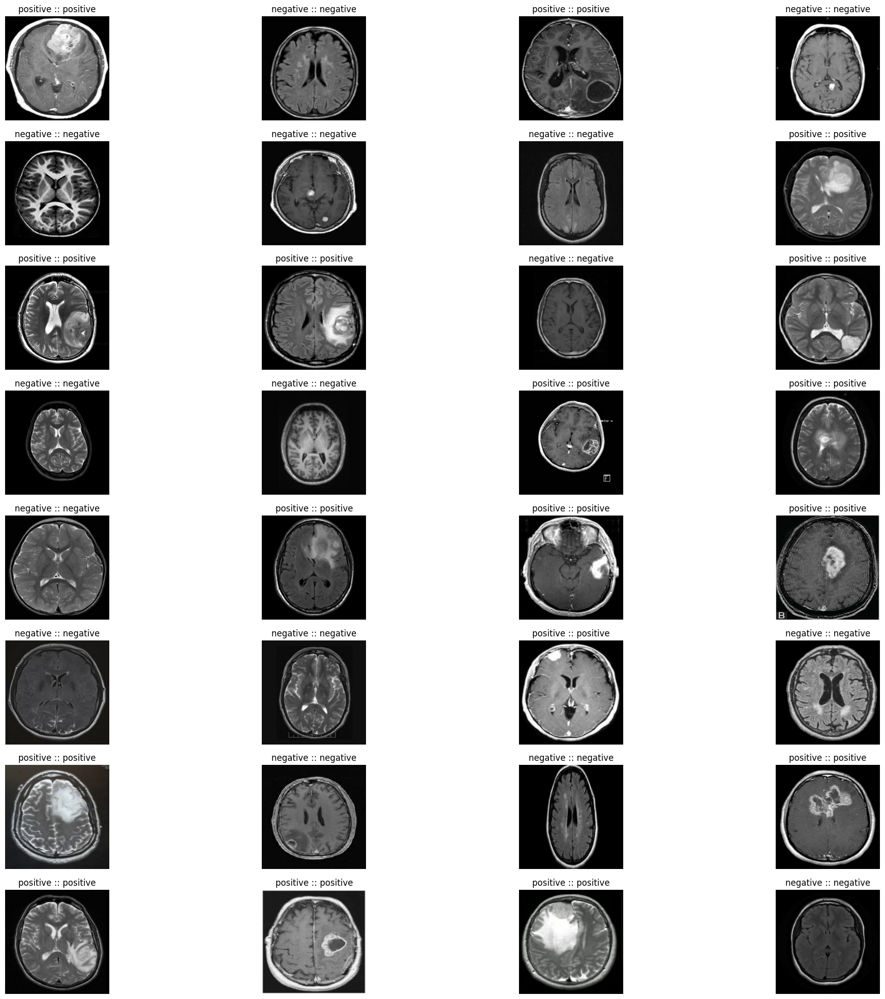

In [31]:
plt.figure(figsize=(25,25))
for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(X_val[i].astype("uint8"))
    plt.title(f'{class_names[y_val[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")

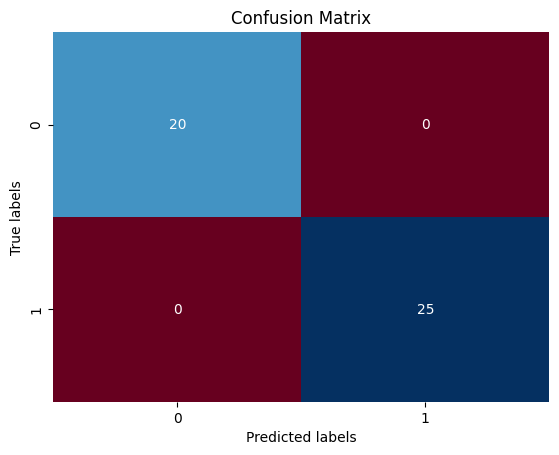

array([[20,  0],
       [ 0, 25]], dtype=int64)

In [32]:
ax= plt.subplot()
CM = confusion_matrix(y_val,y_pred)
sns.heatmap(CM, annot=True, fmt='g', ax=ax,cbar=False,cmap='RdBu')
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels') 
ax.set_title('Confusion Matrix')
plt.show()
CM

In [33]:
Acc = accuracy_score(y_val,y_pred)
print("accuracy is: {0:.3f}%".format(Acc * 100))

accuracy is: 100.000%


## VGG 16

In [34]:
base_model = tf.keras.applications.VGG16(input_shape=(224,224,3),include_top=False,weights='imagenet')
base_model.trainable = False
keras_model=keras.models.Sequential()
keras_model.add(base_model)
keras_model.add(keras.layers.Flatten()) 
keras_model.add(keras.layers.Dropout(0.5))
keras_model.add(keras.layers.Dense(10,activation=tf.nn.softmax))
keras_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_2 (Flatten)         (None, 25088)             0         
                                                                 
 dropout_2 (Dropout)         (None, 25088)             0         
                                                                 
 dense_2 (Dense)             (None, 10)                250890    
                                                                 
Total params: 14965578 (57.09 MB)
Trainable params: 250890 (980.04 KB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


In [35]:
tf.keras.utils.plot_model(keras_model, to_file='model19.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=80)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [36]:
checkpoint =ModelCheckpoint("my_keras_model_VGG16.h5", save_best_only=True)

In [37]:
early_stopping =EarlyStopping(patience=5, restore_best_weights=True)

In [38]:
keras_model.compile(optimizer ='Adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])
hist=keras_model.fit_generator(train,epochs=20,validation_data=validation,callbacks=[checkpoint,early_stopping])

Epoch 1/20
6/6 [==============================] - 49s 8s/step - loss: 10.0080 - accuracy: 0.5659 - val_loss: 1.0329 - val_accuracy: 0.8667
Epoch 2/20
6/6 [==============================] - 49s 8s/step - loss: 2.3915 - accuracy: 0.8516 - val_loss: 1.2216 - val_accuracy: 0.9556
Epoch 3/20
6/6 [==============================] - 49s 8s/step - loss: 0.8933 - accuracy: 0.9396 - val_loss: 0.6014 - val_accuracy: 0.9556
Epoch 4/20
6/6 [==============================] - 49s 8s/step - loss: 0.9698 - accuracy: 0.9341 - val_loss: 1.1075 - val_accuracy: 0.9778
Epoch 5/20
6/6 [==============================] - 49s 8s/step - loss: 1.0180 - accuracy: 0.9396 - val_loss: 0.1211 - val_accuracy: 0.9778
Epoch 6/20
6/6 [==============================] - 48s 8s/step - loss: 0.6795 - accuracy: 0.9560 - val_loss: 0.1260 - val_accuracy: 0.9556
Epoch 7/20
6/6 [==============================] - 49s 8s/step - loss: 0.2094 - accuracy: 0.9890 - val_loss: 5.2982e-09 - val_accuracy: 1.0000
Epoch 8/20
6/6 [=============

In [39]:
score, acc = keras_model.evaluate(validation)
print('Test Loss =', score)
print('Test Accuracy =', acc)

2/2 [==============================] - 10s 3s/step - loss: 0.0000e+00 - accuracy: 1.0000
Test Loss = 0.0
Test Accuracy = 1.0


In [40]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy,val_loss,val_accuracy
0,10.008006,0.565934,1.032859e+00,0.866667
1,2.391455,0.851648,1.221575e+00,0.955556
2,0.893314,0.939560,6.013908e-01,0.955556
3,0.969806,0.934066,1.107533e+00,0.977778
4,1.017987,0.939560,1.210592e-01,0.977778
5,0.679460,0.956044,1.260427e-01,0.955556
6,0.209374,0.989011,5.298190e-09,1.000000
7,0.049811,0.989011,6.622728e-08,1.000000
8,0.318535,0.989011,2.278010e-02,0.977778
9,0.301281,0.983516,2.500605e-06,1.000000


In [41]:
X_val,y_val,y_pred=[],[],[]
for images, labels in validation:
    y_val.extend(labels.numpy())
    X_val.extend(images.numpy())
predictions=keras_model.predict(np.array(X_val))
for i in predictions:
    y_pred.append(np.argmax(i))
df=pd.DataFrame()
df['Actual'],df['Prediction']=y_val,y_pred

2/2 [==============================] - 10s 3s/step


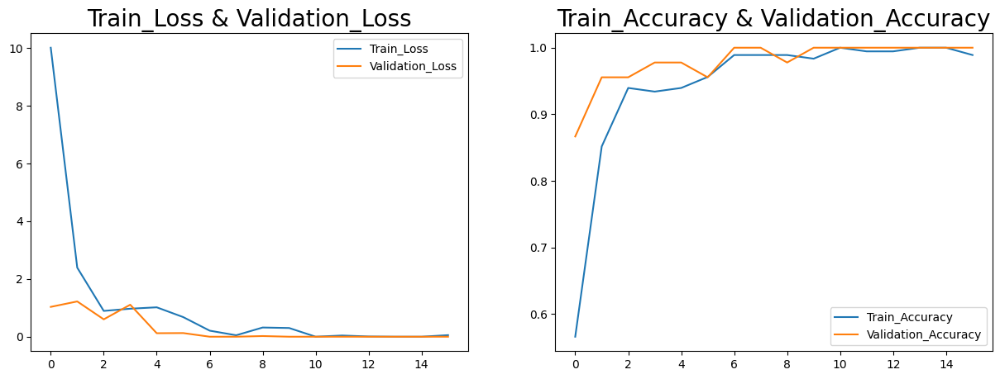

In [42]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()

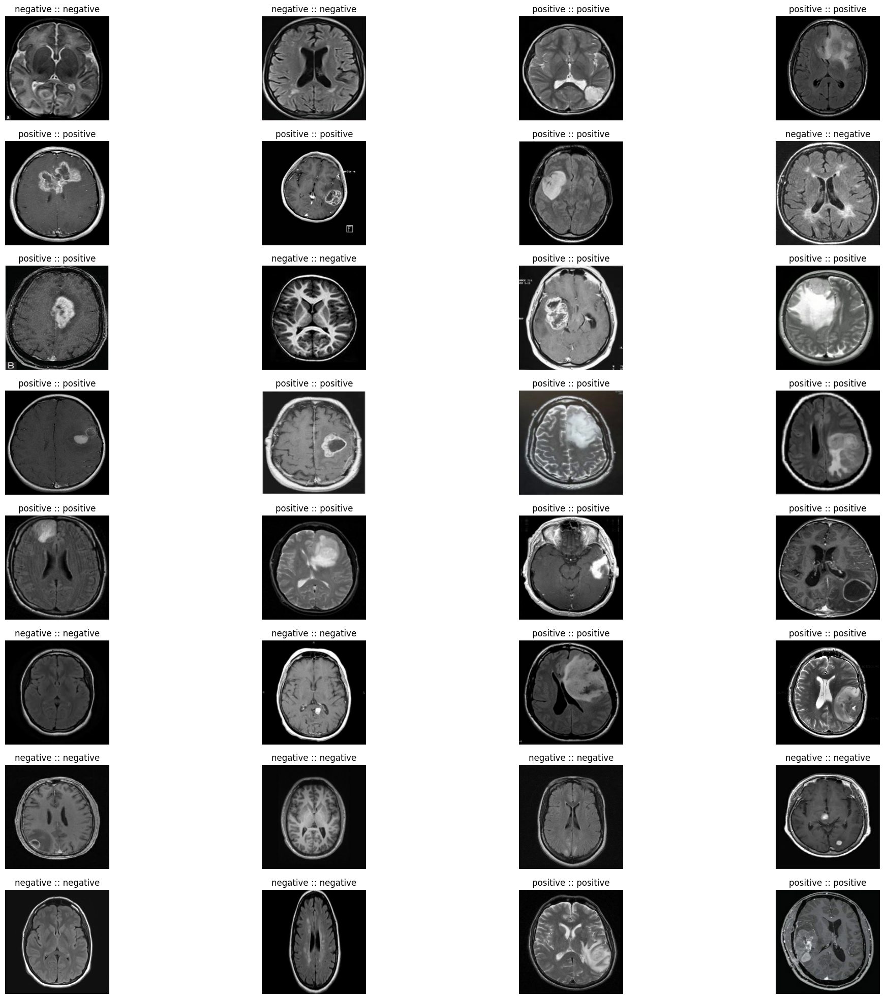

In [43]:
plt.figure(figsize=(25,25))
for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(X_val[i].astype("uint8"))
    plt.title(f'{class_names[y_val[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")

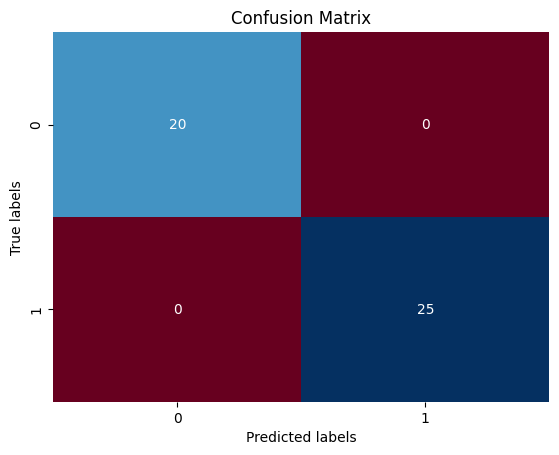

array([[20,  0],
       [ 0, 25]], dtype=int64)

In [44]:
ax= plt.subplot()
CM = confusion_matrix(y_val,y_pred)
sns.heatmap(CM, annot=True, fmt='g', ax=ax,cbar=False,cmap='RdBu')
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels') 
ax.set_title('Confusion Matrix')
plt.show()
CM

In [45]:
Acc = accuracy_score(y_val,y_pred)
print("accuracy is: {0:.3f}%".format(Acc * 100))

accuracy is: 100.000%


## Xception

In [46]:
base_model = tf.keras.applications.Xception(input_shape=(224,224,3),include_top=False,weights='imagenet')
base_model.trainable = False
keras_model=keras.models.Sequential()
keras_model.add(base_model)
keras_model.add(keras.layers.Flatten()) 
keras_model.add(keras.layers.Dropout(0.5))
keras_model.add(keras.layers.Dense(10,activation=tf.nn.softmax))
keras_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 7, 7, 2048)        20861480  
                                                                 
 flatten_3 (Flatten)         (None, 100352)            0         
                                                                 
 dropout_3 (Dropout)         (None, 100352)            0         
                                                                 
 dense_3 (Dense)             (None, 10)                1003530   
                                                                 
Total params: 21865010 (83.41 MB)
Trainable params: 1003530 (3.83 MB)
Non-trainable params: 20861480 (79.58 MB)
_________________________________________________________________


In [47]:
tf.keras.utils.plot_model(keras_model, to_file='model19.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=80)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [48]:
checkpoint = ModelCheckpoint("my_keras_model_Xception.h5", save_best_only=True)

In [49]:
early_stopping =EarlyStopping(patience=5, restore_best_weights=True)

In [50]:
keras_model.compile(optimizer ='Adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])
hist=keras_model.fit_generator(train,epochs=20,validation_data=validation,callbacks=[checkpoint,early_stopping])

Epoch 1/20
6/6 [==============================] - 25s 4s/step - loss: 8.8217 - accuracy: 0.5385 - val_loss: 7.1011 - val_accuracy: 0.7111
Epoch 2/20
6/6 [==============================] - 21s 4s/step - loss: 2.9539 - accuracy: 0.8132 - val_loss: 1.7028 - val_accuracy: 0.8444
Epoch 3/20
6/6 [==============================] - 21s 4s/step - loss: 2.9634 - accuracy: 0.8242 - val_loss: 4.0544 - val_accuracy: 0.8222
Epoch 4/20
6/6 [==============================] - 21s 4s/step - loss: 1.9081 - accuracy: 0.9011 - val_loss: 10.3249 - val_accuracy: 0.7333
Epoch 5/20
6/6 [==============================] - 21s 4s/step - loss: 2.4440 - accuracy: 0.8681 - val_loss: 3.8291 - val_accuracy: 0.8667
Epoch 6/20
6/6 [==============================] - 22s 4s/step - loss: 0.4202 - accuracy: 0.9505 - val_loss: 1.6227 - val_accuracy: 0.8889
Epoch 7/20
6/6 [==============================] - 22s 4s/step - loss: 1.1960 - accuracy: 0.9396 - val_loss: 0.7403 - val_accuracy: 0.9111
Epoch 8/20
6/6 [=================

In [51]:
score, acc = keras_model.evaluate(validation)
print('Test Loss =', score)
print('Test Accuracy =', acc)

2/2 [==============================] - 4s 1s/step - loss: 0.1319 - accuracy: 0.9556
Test Loss = 0.13191738724708557
Test Accuracy = 0.9555555582046509


In [52]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy,val_loss,val_accuracy
0,8.821744,0.538462,7.101066,0.711111
1,2.953898,0.813187,1.702822,0.844444
2,2.963409,0.824176,4.054384,0.822222
3,1.908086,0.901099,10.324875,0.733333
4,2.444017,0.868132,3.829068,0.866667
5,0.420183,0.950549,1.622704,0.888889
6,1.195969,0.939560,0.740276,0.911111
7,0.901914,0.950549,0.573795,0.955556
8,1.482751,0.934066,0.131917,0.955556
9,0.907296,0.934066,1.189902,0.977778


In [53]:
X_val,y_val,y_pred=[],[],[]
for images, labels in validation:
    y_val.extend(labels.numpy())
    X_val.extend(images.numpy())
predictions=keras_model.predict(np.array(X_val))
for i in predictions:
    y_pred.append(np.argmax(i))
df=pd.DataFrame()
df['Actual'],df['Prediction']=y_val,y_pred

2/2 [==============================] - 5s 1s/step


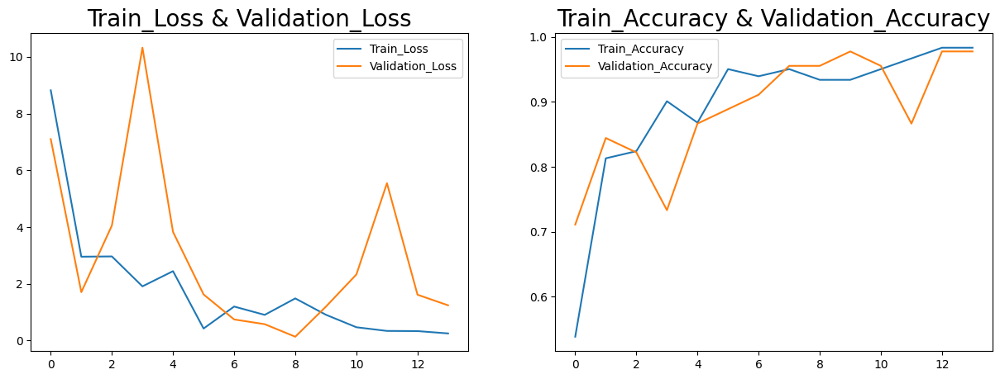

In [54]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()

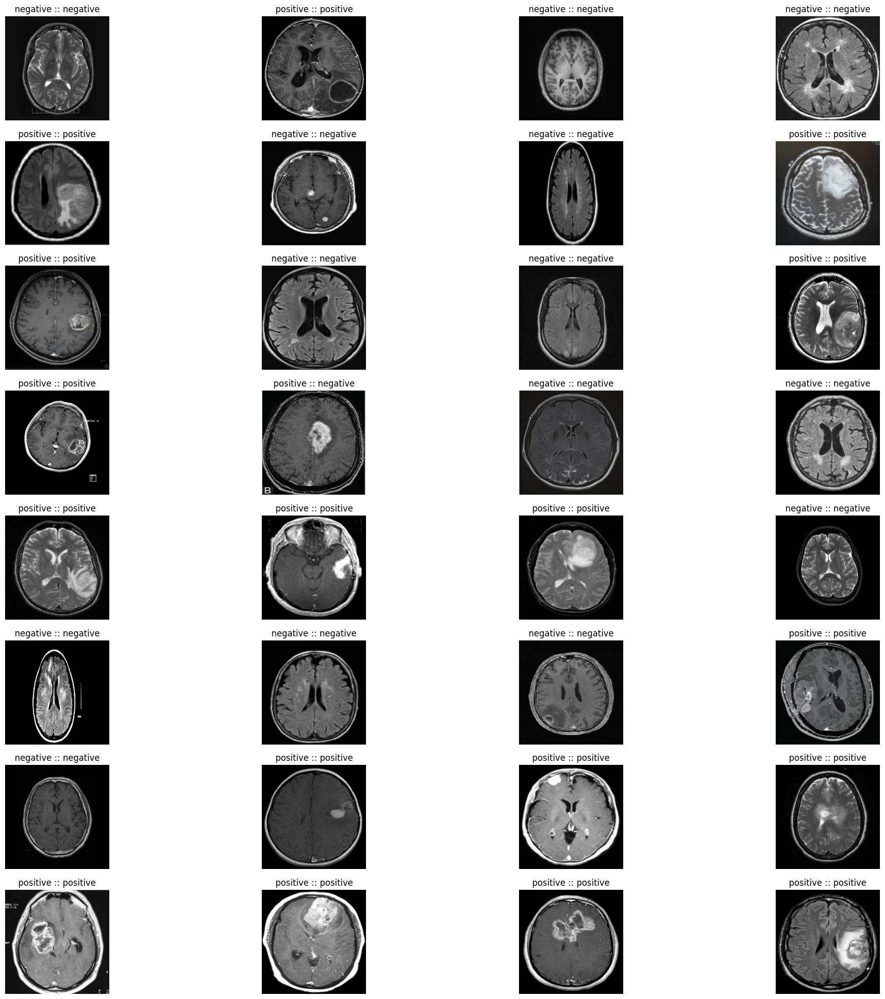

In [55]:
plt.figure(figsize=(25,25))
for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(X_val[i].astype("uint8"))
    plt.title(f'{class_names[y_val[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")

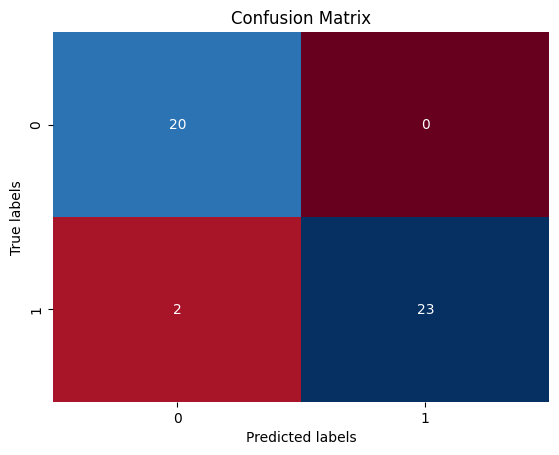

array([[20,  0],
       [ 2, 23]], dtype=int64)

In [56]:
ax= plt.subplot()
CM = confusion_matrix(y_val,y_pred)
sns.heatmap(CM, annot=True, fmt='g', ax=ax,cbar=False,cmap='RdBu')
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels') 
ax.set_title('Confusion Matrix')
plt.show()
CM

In [57]:
Acc = accuracy_score(y_val,y_pred)
print("accuracy is: {0:.3f}%".format(Acc * 100))

accuracy is: 95.556%


## ResNetV2

In [58]:
base_model = tf.keras.applications.ResNet50(input_shape=(224,224,3),include_top=False,weights='imagenet')
base_model.trainable = False
keras_model=keras.models.Sequential()
keras_model.add(base_model)
keras_model.add(keras.layers.Flatten()) 
keras_model.add(keras.layers.Dropout(0.5))
keras_model.add(keras.layers.Dense(10,activation=tf.nn.softmax))
keras_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 flatten_4 (Flatten)         (None, 100352)            0         
                                                                 
 dropout_4 (Dropout)         (None, 100352)            0         
                                                                 
 dense_4 (Dense)             (None, 10)                1003530   
                                                                 
Total params: 24591242 (93.81 MB)
Trainable params: 1003530 (3.83 MB)
Non-trainable params: 23587712 (89.98 MB)
_________________________________________________________________


In [59]:
tf.keras.utils.plot_model(keras_model, to_file='model19.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=80)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [60]:
checkpoint = ModelCheckpoint("my_keras_model_ResNetV2.h5", save_best_only=True)

In [61]:
early_stopping =EarlyStopping(patience=5, restore_best_weights=True)

In [62]:
keras_model.compile(optimizer ='Adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])
hist=keras_model.fit_generator(train,epochs=20,validation_data=validation,callbacks=[checkpoint,early_stopping])

Epoch 1/20
6/6 [==============================] - 26s 4s/step - loss: 4.7088 - accuracy: 0.5659 - val_loss: 0.6249 - val_accuracy: 0.8889
Epoch 2/20
6/6 [==============================] - 21s 4s/step - loss: 0.6981 - accuracy: 0.8901 - val_loss: 0.8359 - val_accuracy: 0.8667
Epoch 3/20
6/6 [==============================] - 23s 4s/step - loss: 0.2958 - accuracy: 0.9396 - val_loss: 0.1219 - val_accuracy: 0.9556
Epoch 4/20
6/6 [==============================] - 24s 4s/step - loss: 0.0876 - accuracy: 0.9835 - val_loss: 0.0379 - val_accuracy: 0.9556
Epoch 5/20
6/6 [==============================] - 22s 4s/step - loss: 0.1400 - accuracy: 0.9670 - val_loss: 1.2091e-04 - val_accuracy: 1.0000
Epoch 6/20
6/6 [==============================] - 22s 4s/step - loss: 0.0805 - accuracy: 0.9835 - val_loss: 1.3862e-05 - val_accuracy: 1.0000
Epoch 7/20
6/6 [==============================] - 22s 4s/step - loss: 4.1505e-05 - accuracy: 1.0000 - val_loss: 6.1958e-06 - val_accuracy: 1.0000
Epoch 8/20
6/6 [==

In [63]:
score, acc = keras_model.evaluate(validation)
print('Test Loss =', score)
print('Test Accuracy =', acc)

2/2 [==============================] - 4s 1s/step - loss: 3.4438e-07 - accuracy: 1.0000
Test Loss = 3.443799982960627e-07
Test Accuracy = 1.0


In [64]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy,val_loss,val_accuracy
0,4.708785e+00,0.565934,6.248760e-01,0.888889
1,6.981269e-01,0.890110,8.359451e-01,0.866667
2,2.957802e-01,0.939560,1.218540e-01,0.955556
3,8.755975e-02,0.983516,3.785591e-02,0.955556
4,1.399831e-01,0.967033,1.209145e-04,1.000000
5,8.051644e-02,0.983516,1.386154e-05,1.000000
6,4.150499e-05,1.000000,6.195792e-06,1.000000
7,8.338685e-02,0.989011,3.443800e-07,1.000000
8,4.945149e-07,1.000000,3.548282e-05,1.000000
9,1.933475e-05,1.000000,2.443400e-03,1.000000


In [65]:
X_val,y_val,y_pred=[],[],[]
for images, labels in validation:
    y_val.extend(labels.numpy())
    X_val.extend(images.numpy())
predictions=keras_model.predict(np.array(X_val))
for i in predictions:
    y_pred.append(np.argmax(i))
df=pd.DataFrame()
df['Actual'],df['Prediction']=y_val,y_pred

2/2 [==============================] - 5s 1s/step


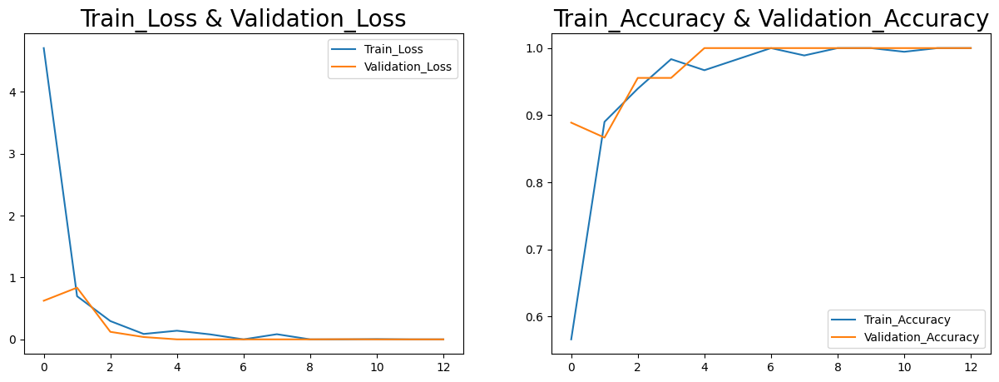

In [66]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()

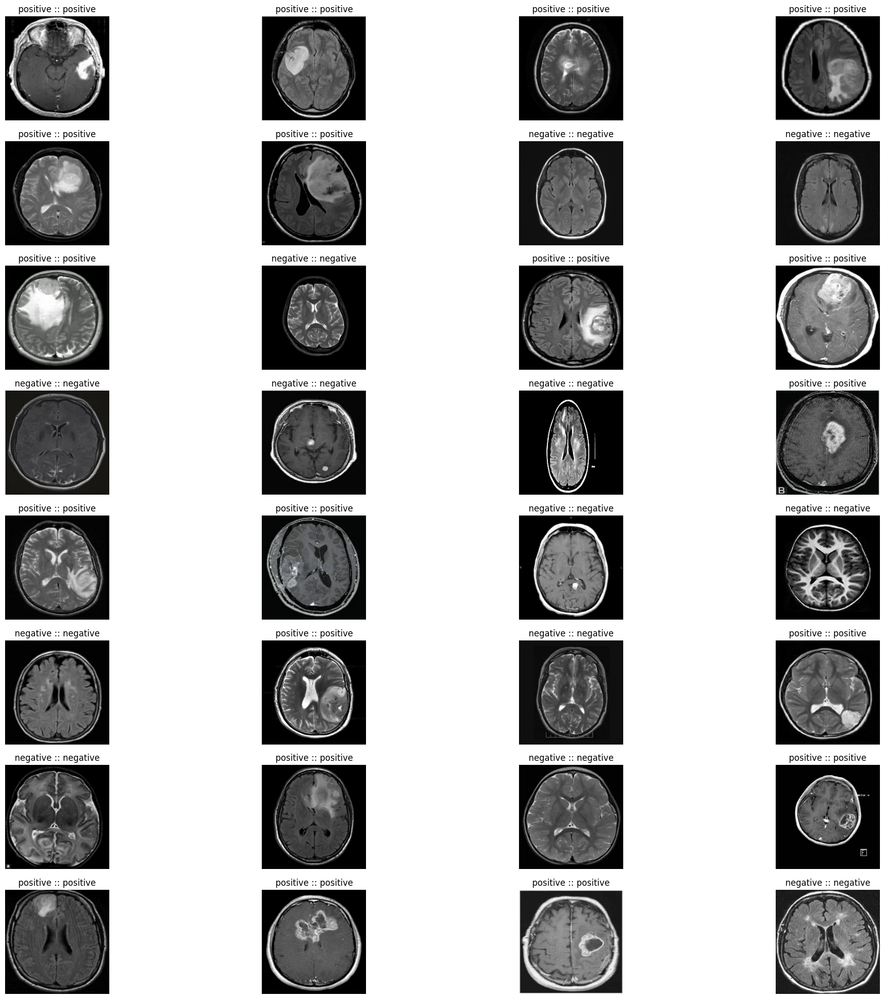

In [67]:
plt.figure(figsize=(25,25))
for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(X_val[i].astype("uint8"))
    plt.title(f'{class_names[y_val[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")

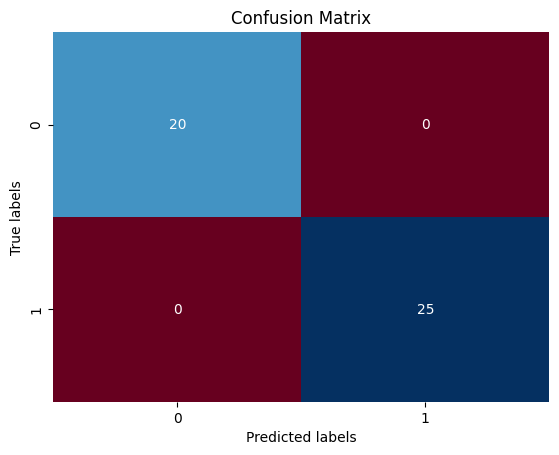

array([[20,  0],
       [ 0, 25]], dtype=int64)

In [68]:
ax= plt.subplot()
CM = confusion_matrix(y_val,y_pred)
sns.heatmap(CM, annot=True, fmt='g', ax=ax,cbar=False,cmap='RdBu')
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels') 
ax.set_title('Confusion Matrix')
plt.show()
CM

In [69]:
Acc = accuracy_score(y_val,y_pred)
print("accuracy is: {0:.3f}%".format(Acc * 100))

accuracy is: 100.000%


## MobileNet

In [70]:
base_model = tf.keras.applications.MobileNet(input_shape=(224,224,3),include_top=False,weights='imagenet')
base_model.trainable = False
keras_model=keras.models.Sequential()
keras_model.add(base_model)
keras_model.add(keras.layers.Flatten()) 
keras_model.add(keras.layers.Dropout(0.5))
keras_model.add(keras.layers.Dense(10,activation=tf.nn.softmax))
keras_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functi  (None, 7, 7, 1024)        3228864   
 onal)                                                           
                                                                 
 flatten_5 (Flatten)         (None, 50176)             0         
                                                                 
 dropout_5 (Dropout)         (None, 50176)             0         
                                                                 
 dense_5 (Dense)             (None, 10)                501770    
                                                                 
Total params: 3730634 (14.23 MB)
Trainable params: 501770 (1.91 MB)
Non-trainable params: 3228864 (12.32 MB)
_________________________________________________________________


In [71]:
tf.keras.utils.plot_model(keras_model, to_file='model19.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=80)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [72]:
checkpoint = ModelCheckpoint("my_keras_model_MobileNet.h5", save_best_only=True)

In [73]:
early_stopping =EarlyStopping(patience=5, restore_best_weights=True)

In [74]:
keras_model.compile(optimizer ='Adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])
hist=keras_model.fit_generator(train,epochs=20,validation_data=validation,callbacks=[checkpoint,early_stopping])

Epoch 1/20
6/6 [==============================] - 8s 1s/step - loss: 4.9275 - accuracy: 0.5495 - val_loss: 0.9500 - val_accuracy: 0.8444
Epoch 2/20
6/6 [==============================] - 5s 876ms/step - loss: 3.0076 - accuracy: 0.7692 - val_loss: 1.6328 - val_accuracy: 0.7333
Epoch 3/20
6/6 [==============================] - 5s 928ms/step - loss: 1.4204 - accuracy: 0.8077 - val_loss: 0.9098 - val_accuracy: 0.8667
Epoch 4/20
6/6 [==============================] - 5s 867ms/step - loss: 0.3192 - accuracy: 0.9231 - val_loss: 1.1090 - val_accuracy: 0.8444
Epoch 5/20
6/6 [==============================] - 5s 930ms/step - loss: 0.4225 - accuracy: 0.9396 - val_loss: 0.0018 - val_accuracy: 1.0000
Epoch 6/20
6/6 [==============================] - 5s 879ms/step - loss: 0.1678 - accuracy: 0.9560 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 7/20
6/6 [==============================] - 5s 876ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.0359 - val_accuracy: 0.9778
Epoch 8/20
6/6 [=======

In [75]:
score, acc = keras_model.evaluate(validation)
print('Test Loss =', score)
print('Test Accuracy =', acc)

2/2 [==============================] - 1s 329ms/step - loss: 0.0018 - accuracy: 1.0000
Test Loss = 0.0017981932032853365
Test Accuracy = 1.0


In [76]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy,val_loss,val_accuracy
0,4.927524,0.549451,0.950023,0.844444
1,3.007561,0.769231,1.632756,0.733333
2,1.420414,0.807692,0.909804,0.866667
3,0.319244,0.923077,1.108967,0.844444
4,0.422468,0.939560,0.001798,1.000000
5,0.167782,0.956044,0.002259,1.000000
6,0.001598,1.000000,0.035940,0.977778
7,0.025554,0.989011,0.073719,0.977778
8,0.003941,0.994505,0.026043,0.977778
9,0.000049,1.000000,0.009822,1.000000


In [77]:
X_val,y_val,y_pred=[],[],[]
for images, labels in validation:
    y_val.extend(labels.numpy())
    X_val.extend(images.numpy())
predictions=keras_model.predict(np.array(X_val))
for i in predictions:
    y_pred.append(np.argmax(i))
df=pd.DataFrame()
df['Actual'],df['Prediction']=y_val,y_pred

2/2 [==============================] - 1s 299ms/step


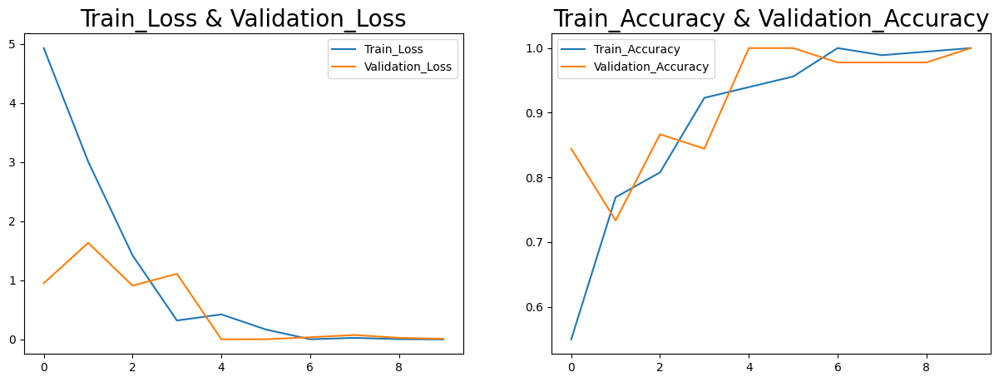

In [78]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()

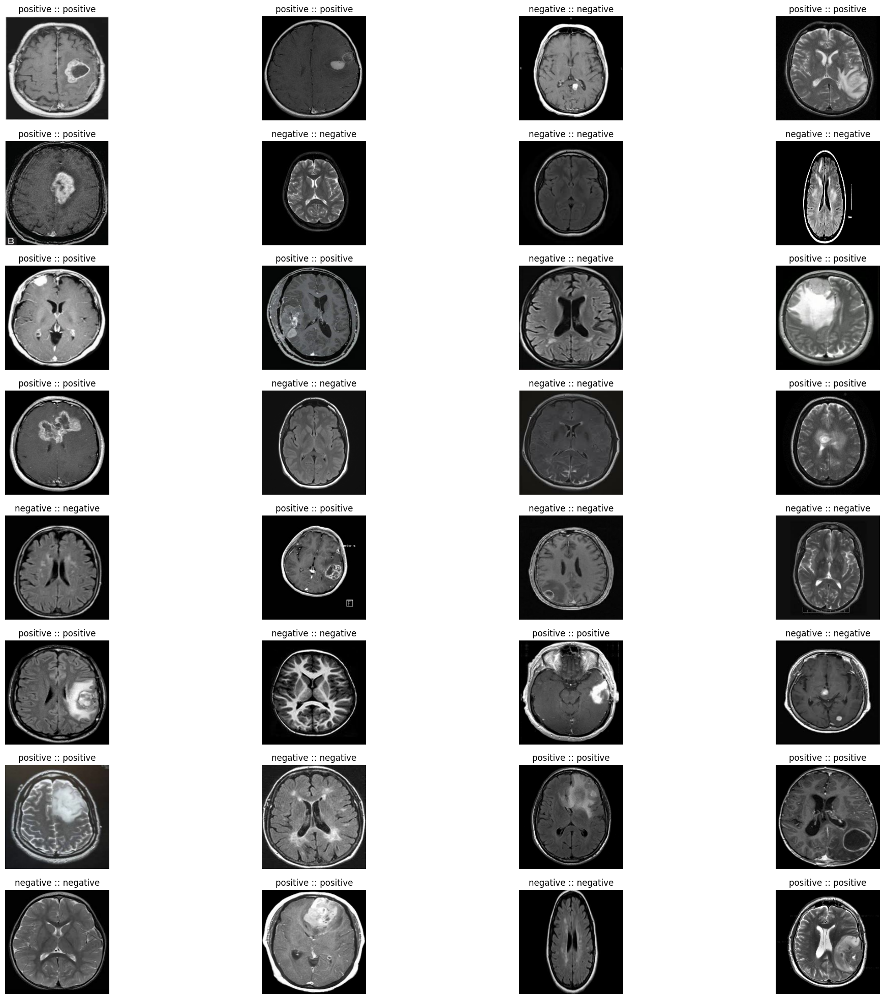

In [79]:
plt.figure(figsize=(25,25))
for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(X_val[i].astype("uint8"))
    plt.title(f'{class_names[y_val[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")

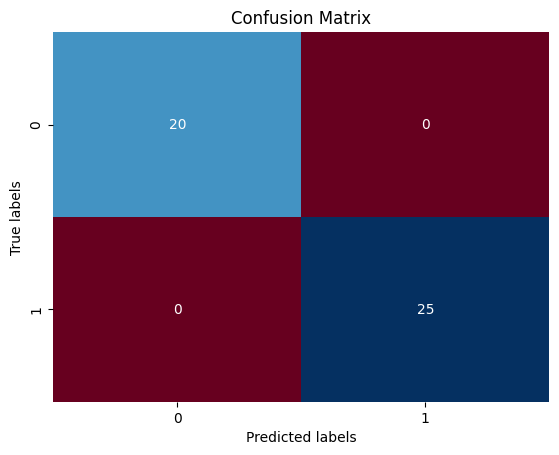

array([[20,  0],
       [ 0, 25]], dtype=int64)

In [80]:
ax= plt.subplot()
CM = confusion_matrix(y_val,y_pred)
sns.heatmap(CM, annot=True, fmt='g', ax=ax,cbar=False,cmap='RdBu')
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels') 
ax.set_title('Confusion Matrix')
plt.show()
CM

In [81]:
Acc = accuracy_score(y_val,y_pred)
print("accuracy is: {0:.3f}%".format(Acc * 100))

accuracy is: 100.000%


## DenseNet201

In [82]:
base_model = tf.keras.applications.MobileNet(input_shape=(224,224,3),include_top=False,weights='imagenet')
base_model.trainable = False
keras_model=keras.models.Sequential()
keras_model.add(base_model)
keras_model.add(keras.layers.Flatten()) 
keras_model.add(keras.layers.Dropout(0.5))
keras_model.add(keras.layers.Dense(10,activation=tf.nn.softmax))
keras_model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functi  (None, 7, 7, 1024)        3228864   
 onal)                                                           
                                                                 
 flatten_6 (Flatten)         (None, 50176)             0         
                                                                 
 dropout_6 (Dropout)         (None, 50176)             0         
                                                                 
 dense_6 (Dense)             (None, 10)                501770    
                                                                 
Total params: 3730634 (14.23 MB)
Trainable params: 501770 (1.91 MB)
Non-trainable params: 3228864 (12.32 MB)
_________________________________________________________________


In [83]:
tf.keras.utils.plot_model(keras_model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=80)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [84]:
checkpoint = ModelCheckpoint("my_keras_model_DenseNet201.h5", save_best_only=True)

In [85]:
early_stopping =EarlyStopping(patience=5, restore_best_weights=True)

In [86]:
keras_model.compile(optimizer ='Adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])
hist=keras_model.fit_generator(train,epochs=20,validation_data=validation,callbacks=[checkpoint,early_stopping])

Epoch 1/20
6/6 [==============================] - 8s 1s/step - loss: 3.5205 - accuracy: 0.4890 - val_loss: 0.4904 - val_accuracy: 0.8667
Epoch 2/20
6/6 [==============================] - 5s 935ms/step - loss: 0.4562 - accuracy: 0.8791 - val_loss: 0.2418 - val_accuracy: 0.9333
Epoch 3/20
6/6 [==============================] - 5s 873ms/step - loss: 0.1311 - accuracy: 0.9560 - val_loss: 0.3070 - val_accuracy: 0.9333
Epoch 4/20
6/6 [==============================] - 6s 1s/step - loss: 0.1127 - accuracy: 0.9725 - val_loss: 0.2032 - val_accuracy: 0.9556
Epoch 5/20
6/6 [==============================] - 5s 870ms/step - loss: 0.0135 - accuracy: 0.9945 - val_loss: 0.2245 - val_accuracy: 0.9556
Epoch 6/20
6/6 [==============================] - 5s 917ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.1425 - val_accuracy: 0.9556
Epoch 7/20
6/6 [==============================] - 5s 878ms/step - loss: 0.0527 - accuracy: 0.9835 - val_loss: 0.2238 - val_accuracy: 0.9556
Epoch 8/20
6/6 [==========

In [87]:
score, acc = keras_model.evaluate(validation)
print('Test Loss =', score)
print('Test Accuracy =', acc)

2/2 [==============================] - 1s 361ms/step - loss: 0.1022 - accuracy: 0.9778
Test Loss = 0.10216306149959564
Test Accuracy = 0.9777777791023254


In [88]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy,val_loss,val_accuracy
0,3.520482,0.489011,0.490356,0.866667
1,0.456226,0.879121,0.241838,0.933333
2,0.131138,0.956044,0.307047,0.933333
3,0.112652,0.972527,0.203224,0.955556
4,0.013548,0.994505,0.224523,0.955556
5,0.001159,1.000000,0.142457,0.955556
6,0.052749,0.983516,0.223763,0.955556
7,0.001276,1.000000,0.255351,0.955556
8,0.000465,1.000000,0.249875,0.955556
9,0.004841,0.994505,0.155166,0.977778


In [89]:
X_val,y_val,y_pred=[],[],[]
for images, labels in validation:
    y_val.extend(labels.numpy())
    X_val.extend(images.numpy())
predictions=keras_model.predict(np.array(X_val))
for i in predictions:
    y_pred.append(np.argmax(i))
df=pd.DataFrame()
df['Actual'],df['Prediction']=y_val,y_pred

2/2 [==============================] - 2s 301ms/step


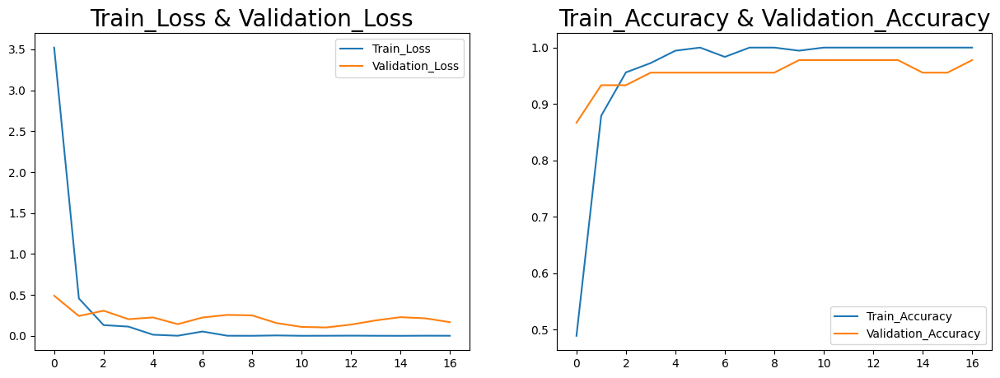

In [90]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()

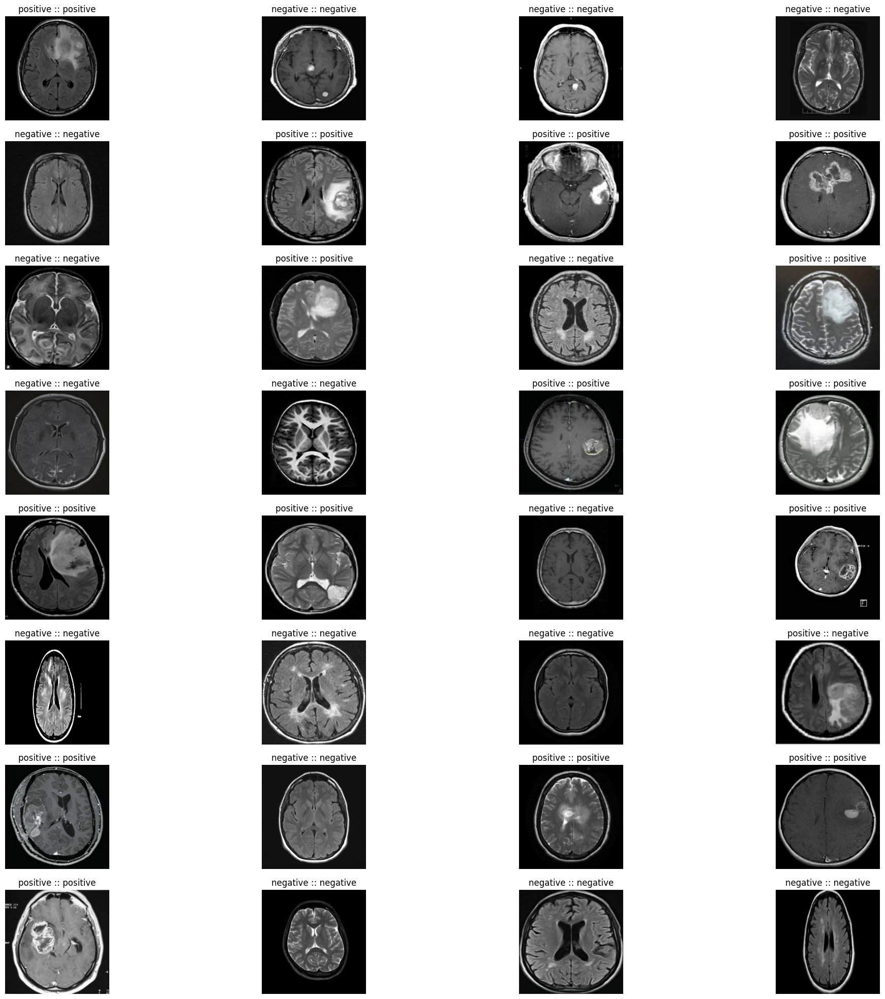

In [91]:
plt.figure(figsize=(25,25))
for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(X_val[i].astype("uint8"))
    plt.title(f'{class_names[y_val[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")

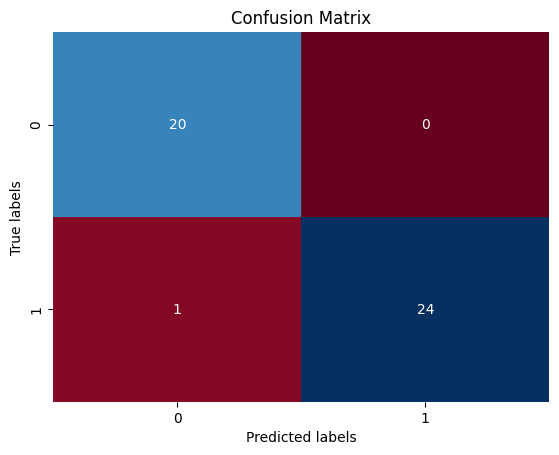

array([[20,  0],
       [ 1, 24]], dtype=int64)

In [92]:
ax= plt.subplot()
CM = confusion_matrix(y_val,y_pred)
sns.heatmap(CM, annot=True, fmt='g', ax=ax,cbar=False,cmap='RdBu')
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels') 
ax.set_title('Confusion Matrix')
plt.show()
CM

In [93]:
Acc = accuracy_score(y_val,y_pred)
print("accuracy is: {0:.3f}%".format(Acc * 100))

accuracy is: 97.778%
